In [1]:
import os, gc
import numpy as np
import torch
import torch.nn.functional as F
import cv2
import OpenEXR, Imath
import depth_pro
import laspy
from PIL import Image
from scipy import ndimage
from scipy.stats import skew
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator
from segment_anything.utils.transforms import ResizeLongestSide
import matplotlib.pyplot as plt

# ── Config ──
DATASET = "test2"
INPUT_FOLDER = f"./data/{DATASET}"
OUTPUT_FOLDER = "./pointclouds"
GT_TO_CENTIMETERS = 10000.0
CAMERA_FOV = 90.0
MIN_DEPTH = 0.001  # in m

os.makedirs(OUTPUT_FOLDER, exist_ok=True)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {device.upper()}, Dataset: {DATASET}")

Device: CUDA, Dataset: test2


In [2]:
def load_exr_rgb(path):
    exr = OpenEXR.InputFile(path)
    dw = exr.header()['dataWindow']
    w, h = dw.max.x - dw.min.x + 1, dw.max.y - dw.min.y + 1
    FLOAT = Imath.PixelType(Imath.PixelType.FLOAT)
    rgb = np.stack([np.frombuffer(exr.channel(c, FLOAT), np.float32).reshape(h, w) for c in 'RGB'], axis=-1)
    return Image.fromarray(np.clip(rgb * 255, 0, 255).astype(np.uint8))

def load_exr_depth(path):
    exr = OpenEXR.InputFile(path)
    header = exr.header()
    dw = header['dataWindow']
    w, h = dw.max.x - dw.min.x + 1, dw.max.y - dw.min.y + 1
    FLOAT = Imath.PixelType(Imath.PixelType.FLOAT)
    channels = list(header['channels'].keys())
    for name in ['R', 'SceneDepth', 'Z']:
        if name in channels:
            depth = np.frombuffer(exr.channel(name, FLOAT), np.float32).reshape(h, w).copy()
            break
    depth_m = (depth * GT_TO_CENTIMETERS) / 100.0
    return depth_m

def load_image(path):
    return load_exr_rgb(path) if path.lower().endswith('.exr') else Image.open(path).convert('RGB')

# ── Find files ──
files = os.listdir(INPUT_FOLDER)
gt_rgb_path = next(os.path.join(INPUT_FOLDER, f) for f in files if f.endswith('.exr') and 'depth' not in f.lower() and 'scenedepth' not in f.lower())
edited_path = next(os.path.join(INPUT_FOLDER, f) for f in files if 'edit' in f.lower() and f.endswith(('.png', '.jpg', '.exr')))
gt_depth_path = next(os.path.join(INPUT_FOLDER, f) for f in files if 'SceneDepth' in f and 'WorldUnits' not in f and f.endswith('.exr'))

print(f"Original: {os.path.basename(gt_rgb_path)}")
print(f"Edited:   {os.path.basename(edited_path)}")
print(f"GT Depth: {os.path.basename(gt_depth_path)}")

Original: HighresScreenshot00000.exr
Edited:   edit2.png
GT Depth: HighresScreenshot00000_SceneDepth.exr


In [3]:
# ── Load all data ──
original_img = load_image(gt_rgb_path)
edited_img = load_image(edited_path)
gt_depth = load_exr_depth(gt_depth_path)
h_gt, w_gt = gt_depth.shape

# ── Detect sky via density knee ──
# UE sky-dome pixels spread across a wide depth range (not a single sentinel),
# creating a flat, sparse tail in the histogram.  Find where the dense scene
# region ends by locating the "knee": the first bin past the peak whose
# raw count drops below 50 % of the peak count.

_gt_pos = gt_depth[gt_depth > MIN_DEPTH].ravel()
_bin_w = 0.25                                         # metres per bin
_bins = np.arange(0, _gt_pos.max() + _bin_w, _bin_w)
_counts, _edges = np.histogram(_gt_pos, bins=_bins)
_centres = (_edges[:-1] + _edges[1:]) / 2

_peak_count = _counts.max()
_peak_bin = _centres[np.argmax(_counts)]
_KNEE_FRAC = 0.05                                     # 50 % of peak
_cands = np.where((_centres > _peak_bin) & (_counts < _peak_count * _KNEE_FRAC))[0]
sky_threshold = _centres[_cands[0]] if len(_cands) > 0 else _gt_pos.max()

sky_mask = gt_depth >= sky_threshold
depth_cap = gt_depth[~sky_mask & (gt_depth > 0)].max() if sky_mask.any() else gt_depth.max()
valid_depth_mask = ~sky_mask & (gt_depth > MIN_DEPTH)

# Resize edited to match original for change detection
edited_resized = edited_img.resize(original_img.size, Image.BILINEAR) if edited_img.size != original_img.size else edited_img

print(f"Original: {original_img.size}, Edited: {edited_img.size}")
print(f"GT depth: {gt_depth.shape}, range: {gt_depth.min():.6f}m - {gt_depth.max():.2f}m")
print(f"Sky threshold (knee): {sky_threshold:.2f}m, sky pixels: {sky_mask.sum():,} ({sky_mask.mean()*100:.1f}%)")
print(f"Depth cap (max non-sky): {depth_cap:.2f}m")

Original: (1526, 858), Edited: (2752, 1536)
GT depth: (858, 1526), range: 0.007629m - 100.00m
Sky threshold (knee): 4.62m, sky pixels: 35,519 (2.7%)
Depth cap (max non-sky): 4.62m


In [4]:
# ── Change detection (GeSCF: SAM Q/K/V attention features + adaptive threshold) ──

# Free GPU memory from any previous run of this cell
for _v in ('mask_gen', 'sam', 'hook', 'qkv1', 'qkv2', 'f1', 'f2', 'cos_sim',
           'prepare_sam', '_hook_qkv', 'sam_masks', 'captured'):
    globals().pop(_v, None)
gc.collect()
torch.cuda.empty_cache()

weights_dir = "./weights"
os.makedirs(weights_dir, exist_ok=True)
weights_path = os.path.join(weights_dir, "sam_vit_b_01ec64.pth")

if not os.path.exists(weights_path):
    print("Downloading SAM ViT-B weights (~375 MB)...")
    import urllib.request
    urllib.request.urlretrieve("https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth", weights_path)

sam = sam_model_registry["vit_b"](checkpoint=weights_path).to(device).eval()
h_img, w_img = np.array(original_img).shape[:2]

# Hook into block 8 (global attention) to capture Q/K/V features
captured = {}
def _hook_qkv(module, input, output):
    captured["qkv"] = output.detach()
hook = sam.image_encoder.blocks[8].attn.qkv.register_forward_hook(_hook_qkv)

# Preprocess both images for SAM
img_size = sam.image_encoder.img_size
sam_transform = ResizeLongestSide(img_size)
patch_size = 16
sam_scale = img_size / max(h_img, w_img)
feat_h, feat_w = int(h_img * sam_scale + 0.5) // patch_size, int(w_img * sam_scale + 0.5) // patch_size

def prepare_sam(pil_img):
    t = sam_transform.apply_image(np.array(pil_img))
    return sam.preprocess(torch.as_tensor(t, device=device).permute(2, 0, 1).unsqueeze(0).float())

# Extract features and compute cosine distance
with torch.no_grad():
    sam.image_encoder(prepare_sam(original_img))
    qkv1 = captured["qkv"]
    sam.image_encoder(prepare_sam(edited_resized))
    qkv2 = captured["qkv"]
hook.remove()

# Free closure references immediately — prepare_sam pins the SAM model,
# _hook_qkv pins the captured dict (which still holds a GPU tensor)
del prepare_sam, _hook_qkv
captured.clear()

with torch.no_grad():
    f1, f2 = qkv1.squeeze(0), qkv2.squeeze(0)
    cos_sim = (F.normalize(f1, dim=-1) * F.normalize(f2, dim=-1)).sum(dim=-1)
    dist_map = (1 - cos_sim).cpu().numpy()[:feat_h, :feat_w]

# Free GPU tensors before SAM mask generation (reduces peak memory)
del qkv1, qkv2, f1, f2, cos_sim
torch.cuda.empty_cache()

# Upsample, smooth, normalize
dist_map = F.interpolate(torch.tensor(dist_map)[None, None].float(), size=(h_img, w_img), mode='bilinear', align_corners=False).squeeze().numpy()
dist_map = ndimage.gaussian_filter(dist_map, sigma=4)
dist_map = (dist_map - dist_map.min()) / (dist_map.max() - dist_map.min() + 1e-8)

# Adaptive threshold (skewness-based, from GeSCF paper)
sk = skew(dist_map.ravel())
k = np.clip(sk, 1.0, 3.0)
threshold = dist_map.mean() + k * dist_map.std()
initial_mask = dist_map > threshold

# SAM segment-level refinement
mask_gen = SamAutomaticMaskGenerator(sam, points_per_side=16, pred_iou_thresh=0.80, stability_score_thresh=0.85, min_mask_region_area=200)
sam_masks = mask_gen.generate(np.array(edited_resized))
changed_mask = np.zeros((h_img, w_img), dtype=bool)
for seg in sam_masks:
    m = seg["segmentation"]
    if m.sum() > 0 and np.logical_and(m, initial_mask).sum() / m.sum() > 0.3:
        changed_mask |= m
if changed_mask.sum() == 0:
    changed_mask = initial_mask

# Free SAM memory — gc.collect() breaks circular refs in PyTorch modules
del sam, mask_gen, sam_masks, captured
gc.collect()
torch.cuda.empty_cache()

# Resize mask to GT depth resolution
if changed_mask.shape != gt_depth.shape:
    changed_mask = cv2.resize(changed_mask.astype(np.uint8), (w_gt, h_gt), interpolation=cv2.INTER_NEAREST) > 0
unchanged_mask = ~changed_mask

print(f"Changed pixels: {changed_mask.sum():,} ({changed_mask.mean()*100:.1f}%)")
print(f"Threshold: {threshold:.4f} (skew={sk:.2f}, k={k:.2f})")
print(f"GPU after SAM cleanup: {torch.cuda.memory_allocated()/1e6:.0f} MB")

Changed pixels: 103,173 (7.9%)
Threshold: 0.5628 (skew=2.67, k=2.67)
GPU after SAM cleanup: 10 MB


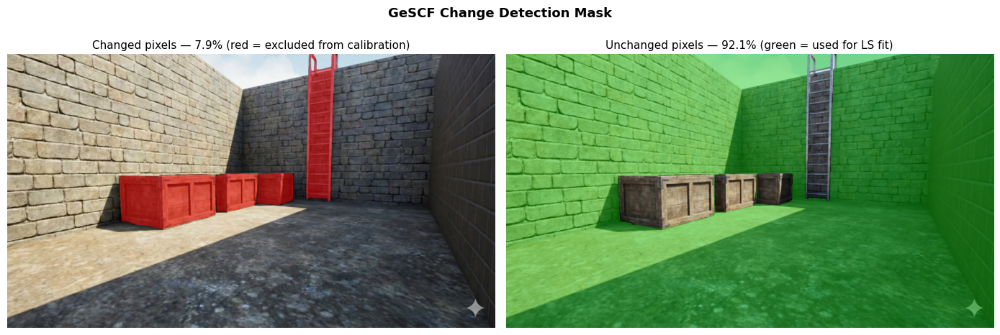

In [5]:
# ── Change mask visualisation ──
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

overlay_c = np.zeros((*changed_mask.shape, 4), dtype=np.float32)
overlay_c[changed_mask] = [1, 0, 0, 0.5]

overlay_u = np.zeros((*changed_mask.shape, 4), dtype=np.float32)
overlay_u[unchanged_mask] = [0, 0.8, 0, 0.4]

axes[0].imshow(edited_resized)
axes[0].imshow(overlay_c)
axes[0].set_title(f'Changed pixels — {changed_mask.mean()*100:.1f}% (red = excluded from calibration)', fontsize=11)
axes[0].axis('off')

axes[1].imshow(edited_resized)
axes[1].imshow(overlay_u)
axes[1].set_title(f'Unchanged pixels — {unchanged_mask.mean()*100:.1f}% (green = used for LS fit)', fontsize=11)
axes[1].axis('off')

plt.suptitle('GeSCF Change Detection Mask', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

In [6]:
# ── Run Depth Pro on edited image ──
# Free any existing model from a previous run of this cell
for _v in ('model', 'transform', 'pred'):
    globals().pop(_v, None)
gc.collect()
torch.cuda.empty_cache()

model, transform = depth_pro.create_model_and_transforms(device=device)
model.eval()

with torch.no_grad():
    pred = model.infer(transform(edited_img), f_px=None)
pred_depth = pred["depth"].squeeze().cpu().numpy()
pred_depth = cv2.resize(pred_depth, (w_gt, h_gt), interpolation=cv2.INTER_LINEAR)

del model, pred, transform
gc.collect()
torch.cuda.empty_cache()
print(f"Predicted depth: {pred_depth.shape}, range: {pred_depth.min():.2f}m - {pred_depth.max():.2f}m")
print(f"GPU after DepthPro cleanup: {torch.cuda.memory_allocated()/1e6:.0f} MB")

Predicted depth: (858, 1526), range: 0.42m - 10000.00m
GPU after DepthPro cleanup: 10 MB


In [7]:
# ── Least squares scaling on unchanged regions ──
valid_base = unchanged_mask & valid_depth_mask & np.isfinite(pred_depth) & np.isfinite(gt_depth)

# Exclude extreme DepthPro predictions (sky overestimates) that would skew regression
pred_cap = np.percentile(pred_depth[valid_base], 98)
valid = valid_base & (pred_depth <= pred_cap)

A = np.vstack([pred_depth[valid].flatten(), np.ones(valid.sum())]).T
scale, shift = np.linalg.lstsq(A, gt_depth[valid].flatten(), rcond=None)[0]
depth_scaled = pred_depth * scale + shift

# Evaluate on the same clean pixel set (excluding pred outliers that inflate errors)
eval_mask = valid
mae = np.mean(np.abs(depth_scaled[eval_mask] - gt_depth[eval_mask]))
rmse = np.sqrt(np.mean((depth_scaled[eval_mask] - gt_depth[eval_mask]) ** 2))
print(f"Pred cap (p98 of valid): {pred_cap:.2f}m — {(valid_base & ~valid).sum():,} outliers excluded")
print(f"LS fit: scale={scale:.4f}, shift={shift:.4f}")
print(f"Unchanged regions — MAE: {mae:.4f}m, RMSE: {rmse:.4f}m")
print(f"Scaled depth range: {depth_scaled.min():.4f}m - {depth_scaled.max():.2f}m")

Pred cap (p98 of valid): 2.76m — 23,457 outliers excluded
LS fit: scale=1.5003, shift=0.0812
Unchanged regions — MAE: 0.0339m, RMSE: 0.0502m
Scaled depth range: 0.7051m - 15003.02m


Peak bin: 0.9m (count: 212,995)
Sky threshold (knee): 4.62m
  Scene (< knee): 1,273,789 pixels (97.3%)
  Tail  (≥ knee): 35,519 pixels (2.7%)
Percentiles — p90: 3.76m, p95: 4.17m, p98: 30.10m


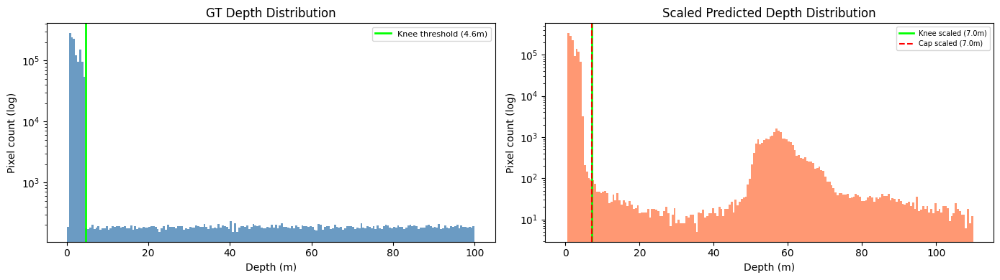

In [8]:
# ── Depth distribution analysis ──
depth_cap_scaled = depth_cap * scale + shift
gt_pos = gt_depth[gt_depth > MIN_DEPTH].ravel()

# Recompute histogram for visualization (sky_threshold already set by knee detection)
bin_width = 0.25
bins_viz = np.arange(0, gt_pos.max() + bin_width, bin_width)
counts_viz, edges_viz = np.histogram(gt_pos, bins=bins_viz)
centres_viz = (edges_viz[:-1] + edges_viz[1:]) / 2

peak_count = counts_viz.max()
peak_bin = centres_viz[np.argmax(counts_viz)]

# Percentile check
p90 = np.percentile(gt_pos, 90)
p95 = np.percentile(gt_pos, 95)
p98 = np.percentile(gt_pos, 98)

# Count pixels in each region
n_scene = (gt_pos < sky_threshold).sum()
n_tail = (gt_pos >= sky_threshold).sum()

print(f"Peak bin: {peak_bin:.1f}m (count: {int(peak_count):,})")
print(f"Sky threshold (knee): {sky_threshold:.2f}m")
print(f"  Scene (< knee): {n_scene:,} pixels ({n_scene/len(gt_pos)*100:.1f}%)")
print(f"  Tail  (≥ knee): {n_tail:,} pixels ({n_tail/len(gt_pos)*100:.1f}%)")
print(f"Percentiles — p90: {p90:.2f}m, p95: {p95:.2f}m, p98: {p98:.2f}m")

# ── Plot ──
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

# GT depth histogram
axes[0].hist(gt_pos, bins=200, range=(0, min(gt_pos.max(), 110)), color='steelblue', alpha=0.8)
axes[0].axvline(sky_threshold, color='lime', ls='-', lw=2, label=f'Knee threshold ({sky_threshold:.1f}m)')
axes[0].set_yscale('log')
axes[0].set_xlabel('Depth (m)')
axes[0].set_ylabel('Pixel count (log)')
axes[0].set_title('GT Depth Distribution')
axes[0].legend(fontsize=8)

# Scaled predicted depth histogram
pred_pos = depth_scaled[depth_scaled > MIN_DEPTH].ravel()
clip_hi = min(pred_pos.max(), 110)
knee_scaled = sky_threshold * scale + shift
axes[1].hist(pred_pos, bins=200, range=(0, clip_hi), color='coral', alpha=0.8)
axes[1].axvline(knee_scaled, color='lime', ls='-', lw=2, label=f'Knee scaled ({knee_scaled:.1f}m)')
axes[1].axvline(depth_cap_scaled, color='red', ls='--', lw=1.5, label=f'Cap scaled ({depth_cap_scaled:.1f}m)')
axes[1].set_yscale('log')
axes[1].set_xlabel('Depth (m)')
axes[1].set_ylabel('Pixel count (log)')
axes[1].set_title('Scaled Predicted Depth Distribution')
axes[1].legend(fontsize=7)

plt.tight_layout()
plt.show()

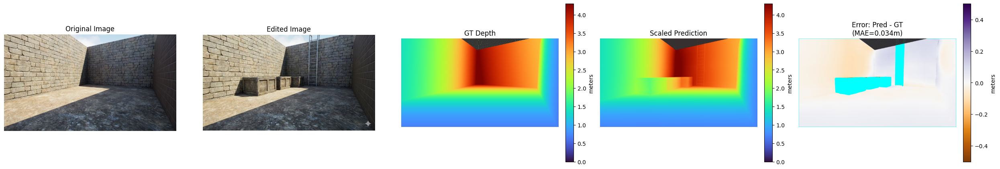

Depth color range: 0.0000m - 4.301m (p99 of non-sky GT)


In [9]:
# ── Visualization ──
from scipy import ndimage as _ndi

# Use p99 of non-sky GT depths for a tight color range that shows room detail
non_sky_depths = gt_depth[~sky_mask & (gt_depth > MIN_DEPTH)]
vmin_depth = 0
vmax_depth = np.percentile(non_sky_depths, 99)

fig, axes = plt.subplots(1, 5, figsize=(25, 5))

# 1. Original image
axes[0].imshow(original_img)
axes[0].set_title('Original Image')
axes[0].axis('off')

# 2. Edited image
axes[1].imshow(edited_img)
axes[1].set_title('Edited Image')
axes[1].axis('off')

# 3. GT depth — sky masked to grey
cmap_depth = plt.cm.turbo
norm_depth = plt.Normalize(vmin=vmin_depth, vmax=vmax_depth)
gt_rgba = cmap_depth(norm_depth(np.clip(gt_depth, vmin_depth, vmax_depth)))
gt_rgba[sky_mask] = [0.2, 0.2, 0.2, 1.0]  # grey for sky
axes[2].imshow(gt_rgba)
axes[2].set_title('GT Depth')
axes[2].axis('off')
sm_depth = plt.cm.ScalarMappable(cmap=cmap_depth, norm=norm_depth)
sm_depth.set_array([])
plt.colorbar(sm_depth, ax=axes[2], fraction=0.046, pad=0.04, label='meters')

# 4. Scaled prediction — sky masked to grey
pred_rgba = cmap_depth(norm_depth(np.clip(depth_scaled, vmin_depth, vmax_depth)))
pred_rgba[sky_mask] = [0.2, 0.2, 0.2, 1.0]  # grey for sky
axes[3].imshow(pred_rgba)
axes[3].set_title('Scaled Prediction')
axes[3].axis('off')
plt.colorbar(sm_depth, ax=axes[3], fraction=0.046, pad=0.04, label='meters')

# 5. Error map — signed, PuOr colormap, masked region in bright cyan
unchanged_mask_clean = _ndi.binary_erosion(unchanged_mask, iterations=2)
error_signed = depth_scaled - gt_depth
error_range = 0.5

# Build RGBA error image: PuOr for unchanged, bright cyan for masked, dark grey for sky
cmap_error = plt.cm.PuOr
norm_error = plt.Normalize(vmin=-error_range, vmax=error_range)
error_rgba = cmap_error(norm_error(np.clip(error_signed, -error_range, error_range)))
# Overwrite masked (changed) pixels with bright cyan
error_rgba[~unchanged_mask_clean] = [0.0, 1.0, 1.0, 1.0]
# Overwrite sky pixels with dark grey
error_rgba[sky_mask] = [0.2, 0.2, 0.2, 1.0]

axes[4].imshow(error_rgba)
axes[4].set_title(f'Error: Pred - GT\n(MAE={mae:.3f}m)')
axes[4].axis('off')

# Add colorbar for the error using a ScalarMappable
sm = plt.cm.ScalarMappable(cmap=cmap_error, norm=norm_error)
sm.set_array([])
plt.colorbar(sm, ax=axes[4], fraction=0.046, pad=0.04, label='meters')

plt.tight_layout()
plt.show()
print(f"Depth color range: {vmin_depth:.4f}m - {vmax_depth:.3f}m (p99 of non-sky GT)")

In [10]:
# ── Generate point cloud ──
w_edit, h_edit = edited_img.size
depth_full = cv2.resize(depth_scaled, (w_edit, h_edit), interpolation=cv2.INTER_LINEAR)
sky_full = cv2.resize(sky_mask.astype(np.uint8), (w_edit, h_edit), interpolation=cv2.INTER_NEAREST) > 0
changed_full = cv2.resize(changed_mask.astype(np.uint8), (w_edit, h_edit), interpolation=cv2.INTER_NEAREST) > 0

# Sky filtering strategy:
#   Unchanged pixels → trust GT sky_mask (scene hasn't changed)
#   Changed pixels   → ignore GT sky_mask (content is new), use predicted depth instead
#                       DepthPro sees the ladder at ~2-4m → keeps it
#                       DepthPro sees exposed sky at >>depth_cap → removes it
depth_cap_scaled = depth_cap * scale + shift
sky_unchanged = sky_full & ~changed_full              # GT sky, unchanged regions only
sky_changed   = changed_full & (depth_full > depth_cap_scaled)  # pred sky, changed regions only
sky_combined  = sky_unchanged | sky_changed

focal = w_edit / (2 * np.tan(np.radians(CAMERA_FOV / 2)))
cx, cy = w_edit / 2, h_edit / 2
xx, yy = np.meshgrid(np.arange(w_edit), np.arange(h_edit))

z = depth_full.flatten()
x = (xx.flatten() - cx) * z / focal
y = (yy.flatten() - cy) * z / focal
rgb = np.array(edited_img).reshape(-1, 3)

mask = (z >= MIN_DEPTH) & ~sky_combined.flatten()
x, y, z, rgb = x[mask], y[mask], z[mask], rgb[mask]
print(f"Point cloud: {len(z):,} points")
print(f"  sky_unchanged: {sky_unchanged.sum():,}, sky_changed: {sky_changed.sum():,}, total sky: {sky_combined.sum():,}")

Point cloud: 4,117,010 points
  sky_unchanged: 108,112, sky_changed: 1,950, total sky: 110,062


In [11]:
# ── Save as LAS ──
output_path = f"{OUTPUT_FOLDER}/{DATASET}_room_edited.las"

header = laspy.LasHeader(point_format=3, version="1.2")
header.scales = np.array([0.001, 0.001, 0.001])
las = laspy.LasData(header=header)

las.x = z       # forward
las.y = -x      # right
las.z = -y      # up
las.red = rgb[:, 0].astype(np.uint16) * 256
las.green = rgb[:, 1].astype(np.uint16) * 256
las.blue = rgb[:, 2].astype(np.uint16) * 256

las.write(output_path)
print(f"Saved {len(z):,} points to {output_path}")

Saved 4,117,010 points to ./pointclouds/test2_room_edited.las


In [12]:
# ── Quick inline point cloud preview ──
import plotly.graph_objects as go

MAX_PREVIEW = 200_000
step_pc = max(1, len(z) // MAX_PREVIEW)
xs, ys, zs = x[::step_pc], y[::step_pc], z[::step_pc]
cs = rgb[::step_pc]

# Tight axis ranges from actual data (p1–p99 + small padding)
# so the view starts already fitted to the scene instead of zoomed way out
_pad = 0.2
x_range = [max(0.0, float(zs.min()) - _pad),  float(np.percentile(zs, 99)) + _pad]
y_range = [float(np.percentile(-xs, 1)) - _pad, float(np.percentile(-xs, 99)) + _pad]
z_range = [float(np.percentile(-ys, 1)) - _pad, float(np.percentile(-ys, 99)) + _pad]

fig = go.Figure(data=[go.Scatter3d(
    x=zs, y=-xs, z=-ys, mode='markers',
    marker=dict(
        size=1,
        color=['rgb({},{},{})'.format(r,g,b) for r,g,b in cs],
    )
)])
fig.update_layout(
    scene=dict(
        xaxis_title='Depth', yaxis_title='Right', zaxis_title='Up',
        xaxis=dict(range=x_range),
        yaxis=dict(range=y_range),
        zaxis=dict(range=z_range),
        aspectmode='data',
        camera=dict(eye=dict(x=-1.5, y=-1.0, z=0.5)),
    ),
    margin=dict(l=0, r=0, t=30, b=0),
    height=700,
    title=f'Point cloud ({len(zs):,} / {len(z):,} pts)',
)
fig.show()

In [13]:
# ── Final GPU cleanup ──
if torch.cuda.is_available():
    gc.collect()
    torch.cuda.empty_cache()
    print(f"GPU memory: {torch.cuda.memory_allocated()/1e6:.1f} MB allocated")

GPU memory: 9.6 MB allocated
